# NETWORK SCAN

In [3]:
import pandas as pd 
import numpy as np
import geopandas as gpd 
import osmnx as ox
import matplotlib.pyplot as plt
import networkx as nx
import time
import seaborn as sns
import ast
import requests
from time import sleep
import openrouteservice
from openrouteservice import client
from openrouteservice import convert
from shapely.geometry import shape, Point
from descartes import PolygonPatch
import network_scan_helper as ns
import importlib
importlib.reload(ns)
import contextily as cx
from mpl_toolkits.axes_grid1 import make_axes_locatable




# import administrative boundaries

administrative boundary was downloaded from: 
https://data.humdata.org/dataset/cod-ab-phl

### 🇵🇭 Administrative Structure of the Philippines

| Level | Administrative Division     | Description / International Equivalent                                         | Number (Approx.)                      |
|-------|-----------------------------|--------------------------------------------------------------------------------|---------------------------------------|
| 1     | **Country**                 | Sovereign state                                                                | 1                                     |
| 2     | **Region**                  | Grouping of provinces for administration and planning (limited autonomy)       | 17 (including BARMM)                  |
| 3     | **Province**                | Major political-administrative division; like a state or county               | 82                                    |
| 4     | **City / Municipality**     | Subdivisions of provinces; cities are more autonomous than municipalities      | ~1,634 (149 cities, 1,485 municipalities) |
| 5     | **Barangay**                | Smallest official unit; like a village, neighborhood, or ward                  | ~42,000+                              |

#### 🔍 Notes:
- **Unit of analysis** we are using adm level 4: City/Municipality as a unit of analysis, i.e., City of Manila, Quezon City, San Miguel, Mangatarem, etc.
- **Regions** are primarily administrative and don’t have elected governments, *except* for **BARMM** (Bangsamoro Autonomous Region in Muslim Mindanao), which is autonomous.
- **Cities** can be:
  - Highly Urbanized Cities (independent of provinces)
  - Component Cities (within provinces)
  - Independent Component Cities (not under provincial control)
- **Barangays** are crucial for community-level governance and data collection.


- focus on road infrastructure investment
- redefining city definition


,validTo,Shape_Leng,Shape_Area,AREA_SQKM
count,0.0,1642.000000,1642.000000,1642.000000
mean,NaN,0.743094,0.014855,178.749543
std,NaN,0.575507,0.017059,205.550055
min,NaN,0.031076,0.000033,0.399814
25%,NaN,0.424162,0.005049,60.478104
50%,NaN,0.605334,0.009301,112.245746
75%,NaN,0.892966,0.017982,215.766606
max,NaN,9.600273,0.191718,2341.425940


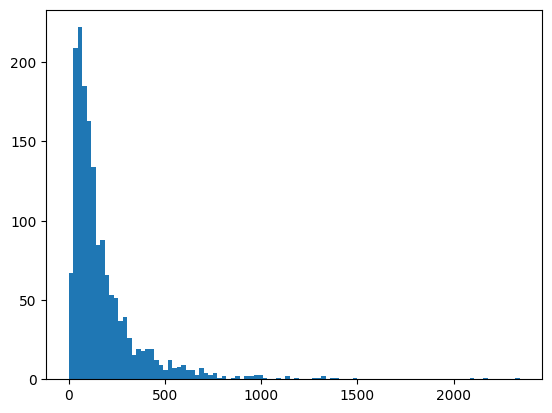

In [4]:
# import
gdf = gpd.read_file('0_raw_data/administrative boundary/phl_admbnda_adm3_psa_namria_20231106.shp')
# area of administrative boundary distribution
plt.hist(gdf.AREA_SQKM, bins=100);
# statistical distribution
gdf.describe()

# Sample analysis for City of Manila

In [10]:
import os

def create_output_folders(city):
    folders = [f'{city}/png', f'{city}/tabular']
    for folder in folders:
        os.makedirs(folder, exist_ok=True)



city = 'City of Valenzuela'
proj_crs = 3121

create_output_folders(city=city)

gdf_city = gdf[gdf.ADM3_EN == city]
gdf_city_buffer = gdf_city.copy().to_crs(proj_crs)
gdf_city_buffer['geometry'] = gdf_city_buffer['geometry'].buffer(1000)
gdf_city_buffer = gdf_city_buffer.to_crs(4326)
map = gdf_city.explore()
gdf_city_buffer.explore(linestyle='--', fill=False, color='Red', m=map)

In [64]:
gdf_city

,ADM3_EN,ADM3_PCODE,ADM2_EN,ADM2_PCODE,ADM1_EN,ADM1_PCODE,ADM0_EN,ADM0_PCODE,date,validOn,validTo,ADM3_REF,ADM3ALT1EN,Shape_Leng,Shape_Area,AREA_SQKM,geometry
1284,City of Valenzuela,PH1307504,Metropolitan Manila Third District,PH13075,National Capital Region (NCR),PH13,Philippines (the),PH,2022-11-09,2023-11-06,NaN,NaN,NaN,0.413528,0.003907,46.552776,"POLYGON ((121.00087 14.75352, 121.00091 14.753..."


### initial extraction

In [15]:
import importlib
importlib.reload(ns)
road_graph, road_edges, road_nodes = ns.extract_road_network(gdf_polygon=gdf_city_buffer, network_type='all', simplify=True, verbose=True)

Graph extraction took 10.62 seconds
Graph to GeoDataFrame conversion took 1.73 seconds
Flattening 'highway' values took 0.01 seconds
Simplifying road hierarchy took 0.01 seconds

Total time: 12.39 seconds


# EDGES & NODES - Descriptive Analysis

### visualizing road hierarchy

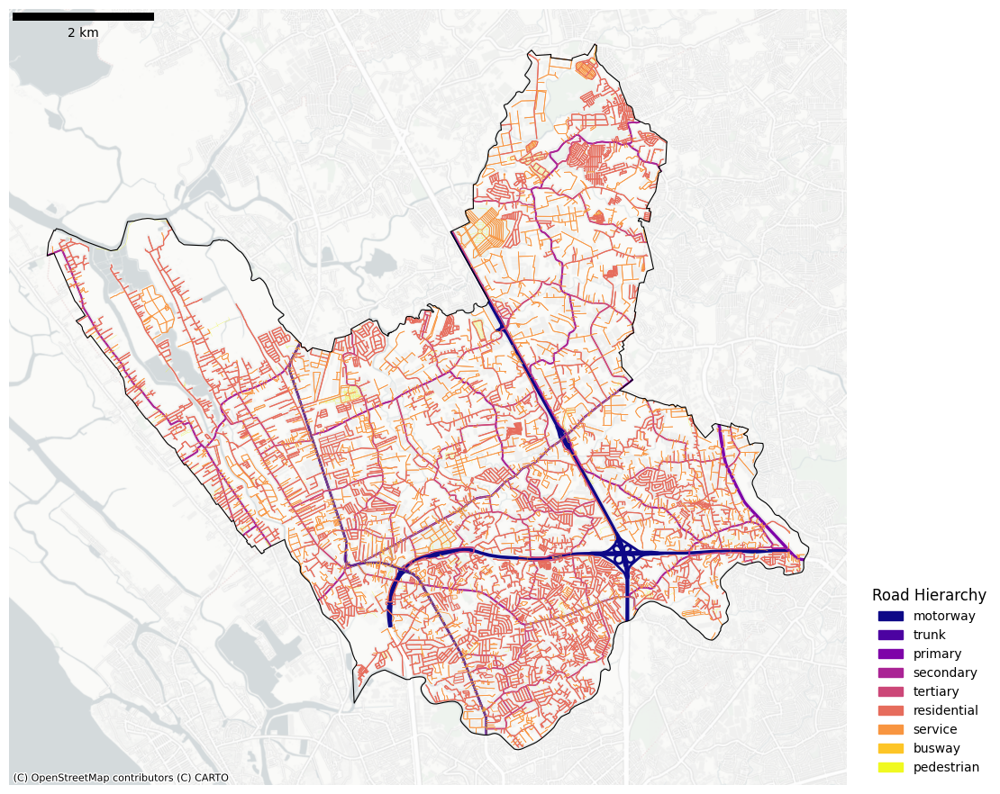

In [18]:
importlib.reload(ns)
# Generate the plot
ax = ns.map_road_hierarchy(road_edges=road_edges.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='plasma')
# Save the figure as PNG
fig = ax.figure
fig.savefig(f"{city}/png/map_road_hierarchy.png", dpi=300, bbox_inches='tight')

/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/2614567140.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  desc = road_edges.groupby('highway_cat')['length'].describe()
/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/2614567140.py:3: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  desc['sum'] = road_edges.groupby('highway_cat')['length'].sum()


,count,mean,std,min,25%,50%,75%,max,sum,length_km
highway_cat,,,,,,,,,,
motorway,118.0,377.092093,465.075462,3.597,79.05775,198.5915,446.464,2590.574,44496.867,44.496867
trunk,586.0,32.880391,39.598113,1.744,9.33600,21.1530,39.901,366.286,19267.909,19.267909
primary,876.0,33.954750,46.691760,0.590,10.40325,20.0785,41.578,506.660,29744.361,29.744361
secondary,2590.0,47.263119,48.304707,0.560,16.24275,32.2745,59.372,358.299,122411.478,122.411478
tertiary,3508.0,56.479421,62.290242,0.962,20.22350,40.1100,72.375,1225.071,198129.810,198.129810
residential,22642.0,64.047146,57.832938,0.574,26.12300,46.2160,84.601,1167.008,1450155.486,1450.155486
service,11534.0,64.764832,64.923999,0.388,24.23200,46.4770,83.385,868.277,746997.577,746.997577
busway,5.0,24.140800,25.120165,4.655,9.08300,14.9070,25.123,66.936,120.704,0.120704
pedestrian,6066.0,35.281325,49.834771,0.121,5.97400,22.0085,47.339,1324.050,214016.517,214.016517


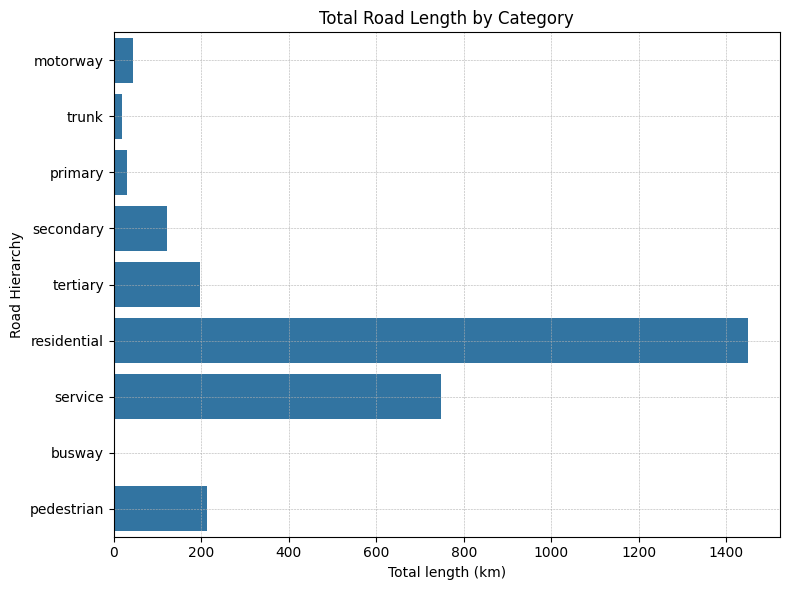

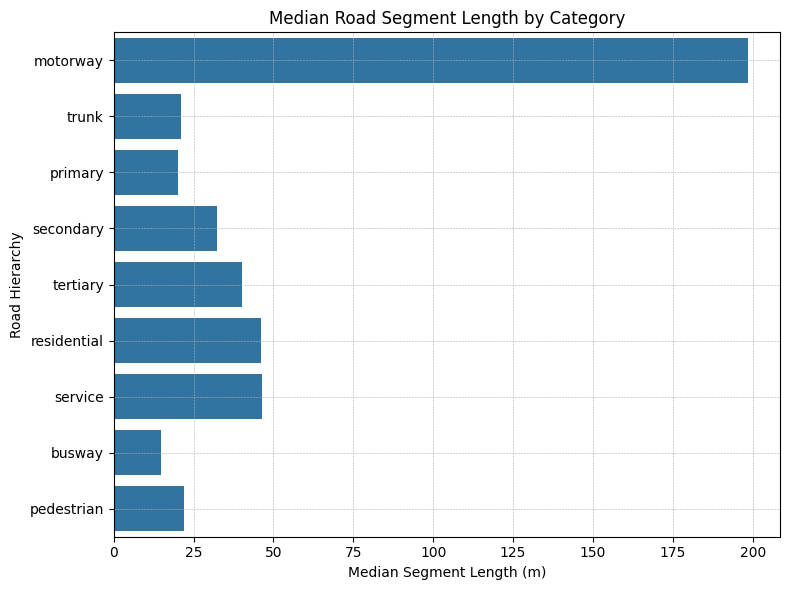

In [20]:
# calculate length
desc = road_edges.groupby('highway_cat')['length'].describe()
desc['sum'] = road_edges.groupby('highway_cat')['length'].sum()
desc['length_km'] = desc['sum']/1000
display(desc)
desc.to_csv(f'{city}/tabular/road_by_hierarchy.csv')

# Plot 1: Total length by category
plt.figure(figsize=(8, 6))
sns.barplot(data=desc, x='length_km', y=desc.index)
plt.grid(visible=True, linewidth=0.4, linestyle='--')
plt.xlabel('Total length (km)')
plt.ylabel('Road Hierarchy')
plt.title('Total Road Length by Category')
plt.tight_layout()
plt.savefig(f'{city}/png/chart_totalroadlength_by_category.png', dpi=300, bbox_inches='tight')

# Plot 2: Median length by category
plt.figure(figsize=(8, 6))
sns.barplot(data=desc, x='50%', y=desc.index)
plt.grid(visible=True, linewidth=0.4, linestyle='--')
plt.xlabel('Median Segment Length (m)')
plt.ylabel('Road Hierarchy')
plt.title('Median Road Segment Length by Category')
plt.tight_layout()
plt.savefig(f'{city}/png/chart_medianroadlength_by_category.png', dpi=300, bbox_inches='tight')

# Road Orientations

(<Figure size 800x800 with 1 Axes>,
 <PolarAxes: title={'center': 'City of Valenzuela'}>)

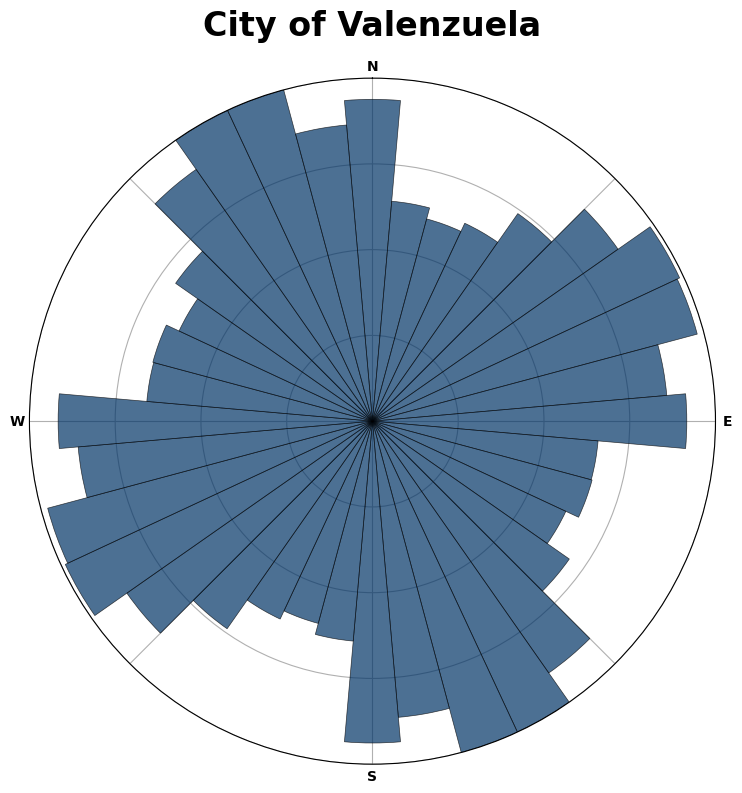

In [ ]:
road_bearing = ox.add_edge_bearings(ox.convert.to_undirected(road_graph))
fig, ax = ox.plot.plot_orientation(road_bearing, title=city, area=True, figsize=(8,8))


### Basic Stats

In [59]:
importlib.reload(ns)
df_stats=ns.calc_basic_stats(graph=road_graph)
df_stats.to_csv(f'{city}/tabular/network_metric.csv')
df_stats[['Metric', 'Value']].T.to_dict()

Calculating basic stats took 12.77 seconds


{0: {'Metric': 'n', 'Value': 19526},
 1: {'Metric': 'm', 'Value': 47942},
 2: {'Metric': 'k_avg', 'Value': 4.91},
 3: {'Metric': 'edge_length_total', 'Value': 2827109.34},
 4: {'Metric': 'edge_length_avg', 'Value': 58.97},
 5: {'Metric': 'streets_per_node_avg', 'Value': 2.54},
 6: {'Metric': 'streets_per_node_counts',
  'Value': '{0: 0, 1: 5583, 2: 33, 3: 11633, 4: 2261, 5: 16}'},
 7: {'Metric': 'streets_per_node_proportions',
  'Value': '{0: 0.0, 1: 0.2859264570316501, 2: 0.001690054286592236, 3: 0.5957697429068933, 4: 0.11579432551469836, 5: 0.0008194202601659326}'},
 8: {'Metric': 'intersection_count', 'Value': 13943},
 9: {'Metric': 'street_length_total', 'Value': 1470986.73},
 10: {'Metric': 'street_segment_count', 'Value': 24732},
 11: {'Metric': 'street_length_avg', 'Value': 59.48},
 12: {'Metric': 'circuity_avg', 'Value': 1.08},
 13: {'Metric': 'self_loop_proportion', 'Value': 0.0}}

In [62]:
df_stats[['Metric', 'Value']].set_index('Metric').to_dict()

{'Value': {'n': 19526,
  'm': 47942,
  'k_avg': 4.91,
  'edge_length_total': 2827109.34,
  'edge_length_avg': 58.97,
  'streets_per_node_avg': 2.54,
  'streets_per_node_counts': '{0: 0, 1: 5583, 2: 33, 3: 11633, 4: 2261, 5: 16}',
  'streets_per_node_proportions': '{0: 0.0, 1: 0.2859264570316501, 2: 0.001690054286592236, 3: 0.5957697429068933, 4: 0.11579432551469836, 5: 0.0008194202601659326}',
  'intersection_count': 13943,
  'street_length_total': 1470986.73,
  'street_segment_count': 24732,
  'street_length_avg': 59.48,
  'circuity_avg': 1.08,
  'self_loop_proportion': 0.0}}

### Getting median lane width & maxspeed

/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/1645874068.py:44: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  lanes_speed_df = road_edges.groupby(by='highway_cat')[['lanes_clean', 'maxspeed_clean']].median().reset_index()


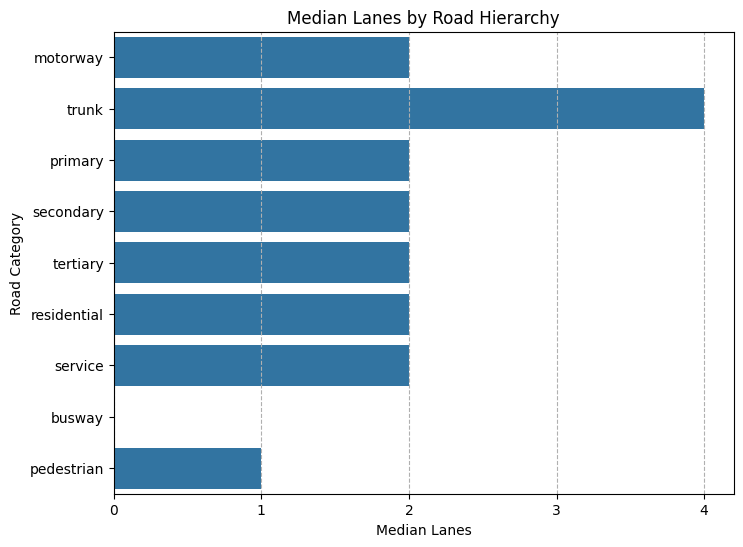

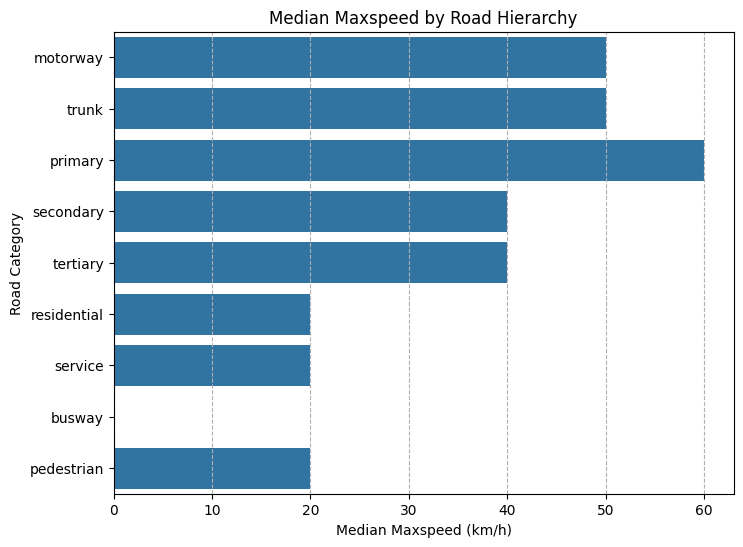

In [23]:
road_edges['lanes_clean'] = None
road_edges['maxspeed_clean'] = None

for i in range(len(road_edges)):
    val = road_edges['lanes'].iloc[i]
    if isinstance(val, list):
        # Convert string values to float or int
        try:
            road_edges.at[i, 'lanes_clean'] = int(min([float(x) for x in val]))
        except:
            continue
    elif pd.isna(val):
        continue
    else:
        try:
            road_edges.at[i, 'lanes_clean'] = int(float(val))
        except:
            continue

for i in range(len(road_edges)):
    val = road_edges['maxspeed'].iloc[i]
    if isinstance(val, list):
        # Convert string values to float or int
        try:
            road_edges.at[i, 'maxspeed_clean'] = int(min([float(x) for x in val]))
        except:
            continue
    elif pd.isna(val):
        continue
    else:
        try:
            road_edges.at[i, 'maxspeed_clean'] = int(float(val))
        except:
            continue


road_edges['lanes_clean']= road_edges['lanes_clean'].astype('Int64')
road_edges['maxspeed_clean']= road_edges['maxspeed_clean'].astype('Int64')

import matplotlib.pyplot as plt
import seaborn as sns

# Prepare data
lanes_speed_df = road_edges.groupby(by='highway_cat')[['lanes_clean', 'maxspeed_clean']].median().reset_index()
lanes_sort = lanes_speed_df.dropna(subset=['lanes_clean'])#.sort_values(by='lanes_clean', ascending=True)
speed_sort = lanes_speed_df.dropna(subset=['maxspeed_clean'])#.sort_values(by='maxspeed_clean', ascending=True)

# Plot figures
plt.figure(figsize=(8, 6))
sns.barplot(data=lanes_sort, y='highway_cat', x='lanes_clean')
plt.title('Median Lanes by Road Hierarchy')
plt.xlabel('Median Lanes')
plt.xticks(np.linspace(0,4,num=5))
plt.ylabel('Road Category')
plt.grid(which='both', axis='x', linestyle= '--')

plt.figure(figsize=(8, 6))
sns.barplot(data=speed_sort, y='highway_cat', x='maxspeed_clean')
plt.title('Median Maxspeed by Road Hierarchy')
plt.xlabel('Median Maxspeed (km/h)')
plt.ylabel('Road Category')
plt.grid(which='both', axis='x', linestyle= '--')

### Intersections

In [24]:
# Get the string from the dataframe and convert it to a dict
streets_per_node_counts_str = df_stats[df_stats.Metric == 'streets_per_node_counts'].Value.values[0]
streets_per_node_counts = ast.literal_eval(streets_per_node_counts_str)

# Description mapping
descriptions = {
    0: "Isolated node (possible data error)",
    1: "Dead ends",
    2: "Mid-block geometry point, i.e., bend/curve",
    3: "3-way intersection (T-junction)",
    4: "4-way intersection (crossroad)",
    5: "5-way intersection",
    6: "6-way intersection"
}

# Create dataframe
street_node_df = pd.DataFrame([
    {"streets_per_node": k, "description": descriptions.get(k, "Other"), "count": v}
    for k, v in streets_per_node_counts.items()
])

# Sort and display
street_node_df = street_node_df.sort_values(by="streets_per_node").reset_index(drop=True)
display(street_node_df)


,streets_per_node,description,count
0,0,Isolated node (possible data error),0
1,1,Dead ends,5583
2,2,"Mid-block geometry point, i.e., bend/curve",33
3,3,3-way intersection (T-junction),11633
4,4,4-way intersection (crossroad),2261
5,5,5-way intersection,16


### Visualizing intersection degree
how many streets are connected to each intersection node? 

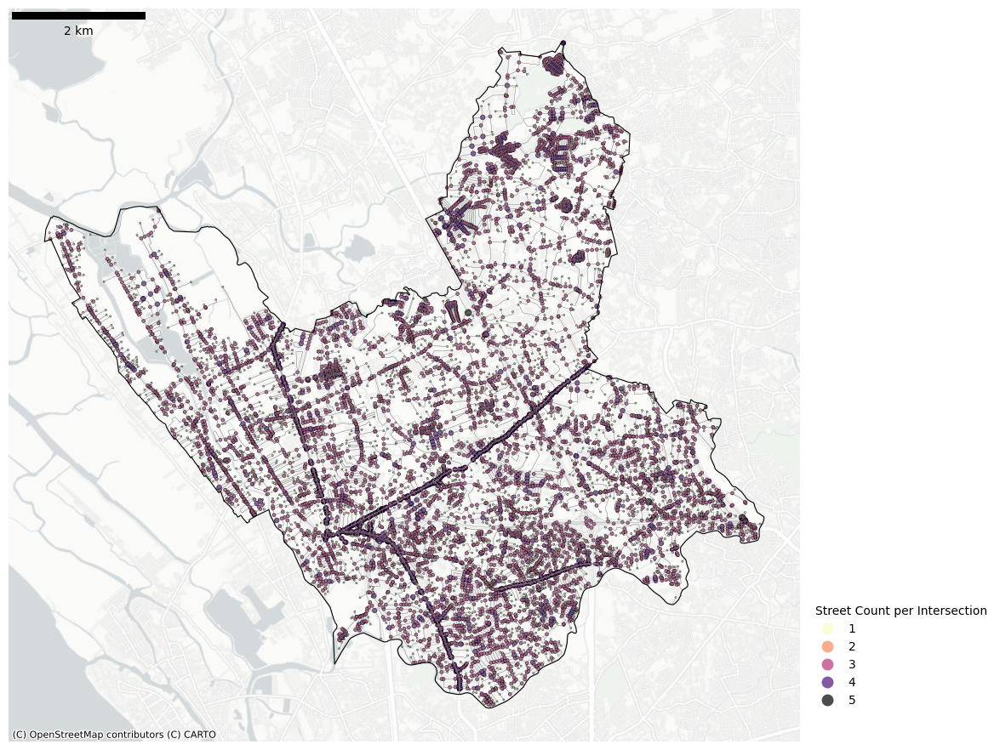

In [26]:
import matplotlib.patches as mpatches
from matplotlib_scalebar.scalebar import ScaleBar # type: ignore
importlib.reload(ns)

# call function to map intersections
ax = ns.map_road_intersections(road_edges=road_edges.clip(gdf_city), road_nodes=road_nodes.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='magma_r')
# Save the figure as PNG
fig = ax.figure
fig.savefig(f"{city}/png/map_road_intersections.png", dpi=300, bbox_inches='tight')

## CENTRALITY ANALYSIS: Closeness & Betweenness Analysis
- **Closeness Analysis**: where is the most central location in this city? 
- **Betweenness Analysis**: where is the most critical connectors for this city?

notes: try different k for different city sizes

In [33]:
importlib.reload(ns)
import random
# determining sample size 5% of nodes, bounded between 100–1000
n_nodes = len(road_nodes)
k = min(1000, max(100, int(n_nodes * 0.05)))
print(f'total nodes: {n_nodes}, sample size (k): {k}')

# compute centrality
nodes_centrality, edges_centrality =ns.compute_graph_centralities(graph=road_graph, 
                                                                  degree_centrality=True, 
                                                                  node_closeness_centrality=True, 
                                                                  node_betweenness_centrality=True,
                                                                  edge_betweenness_centrality=True,
                                                                  k=k, #scale according to city size
                                                                  seed=16
                                                                  )

total nodes: 19526, sample size (k): 976
✔ Node Degree Centrality computed.
✔ Node Closeness Centrality computed (sampled: 976 nodes).
✔ Node Betweenness Centrality computed.
✔ Edge Betweenness Centrality computed.
✅ Total computation time: 708.60 seconds


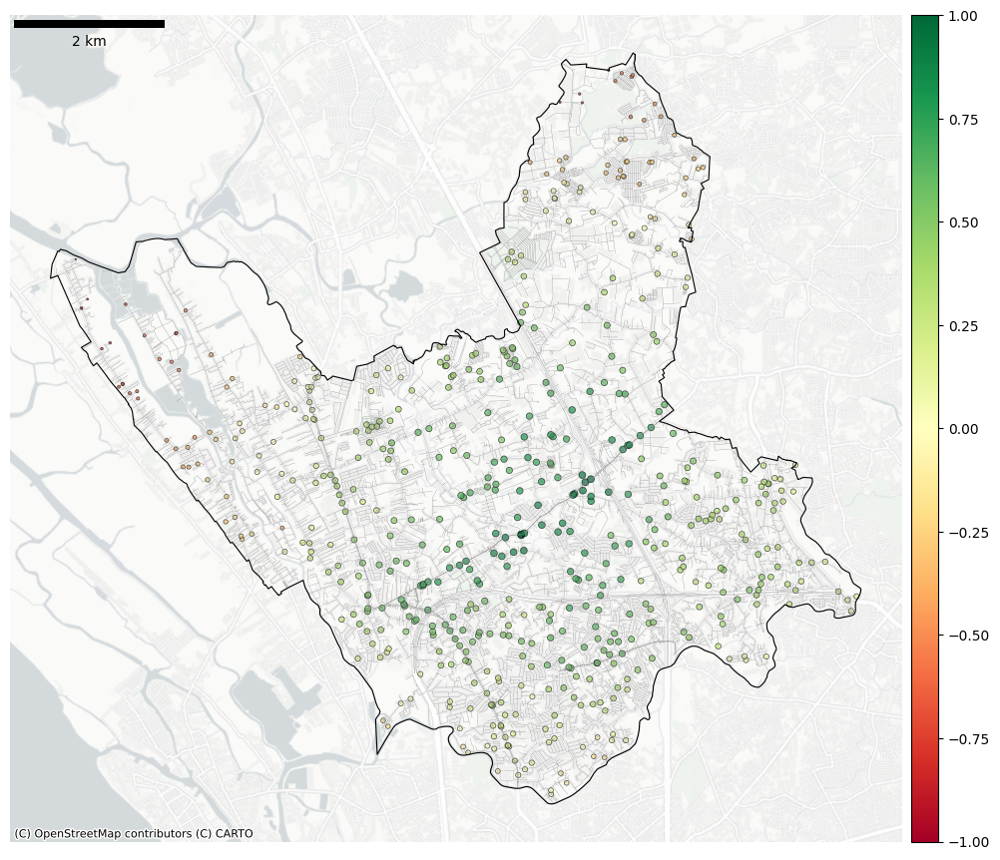

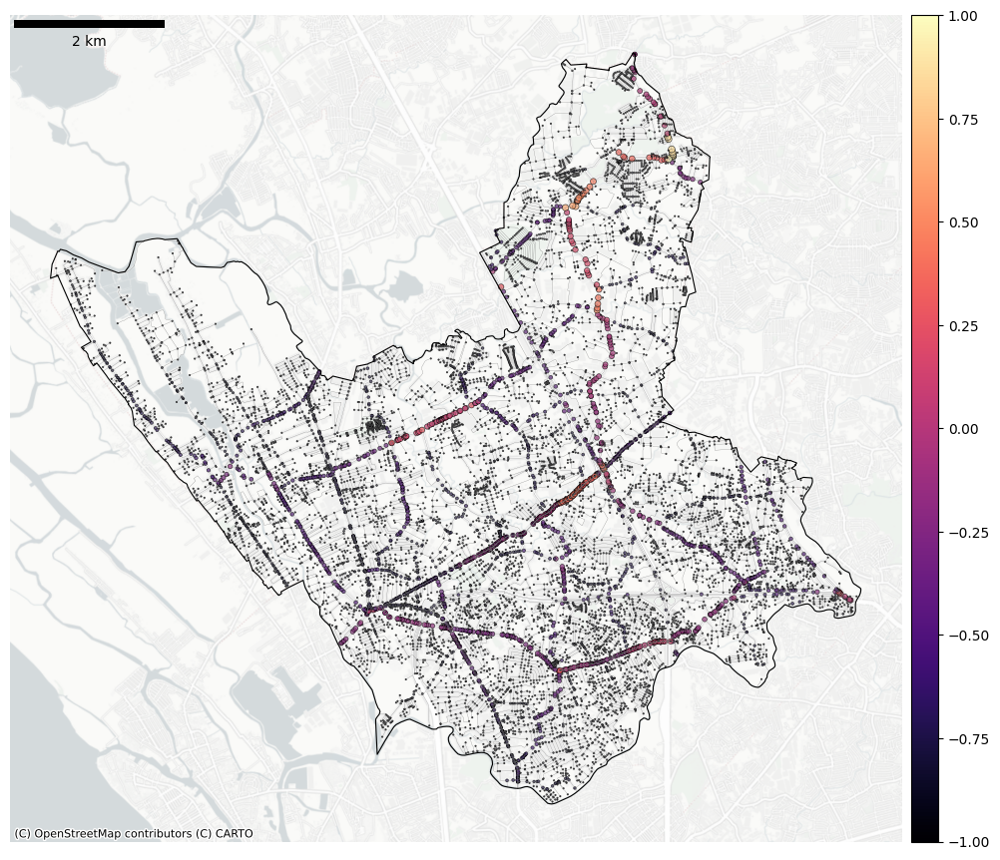

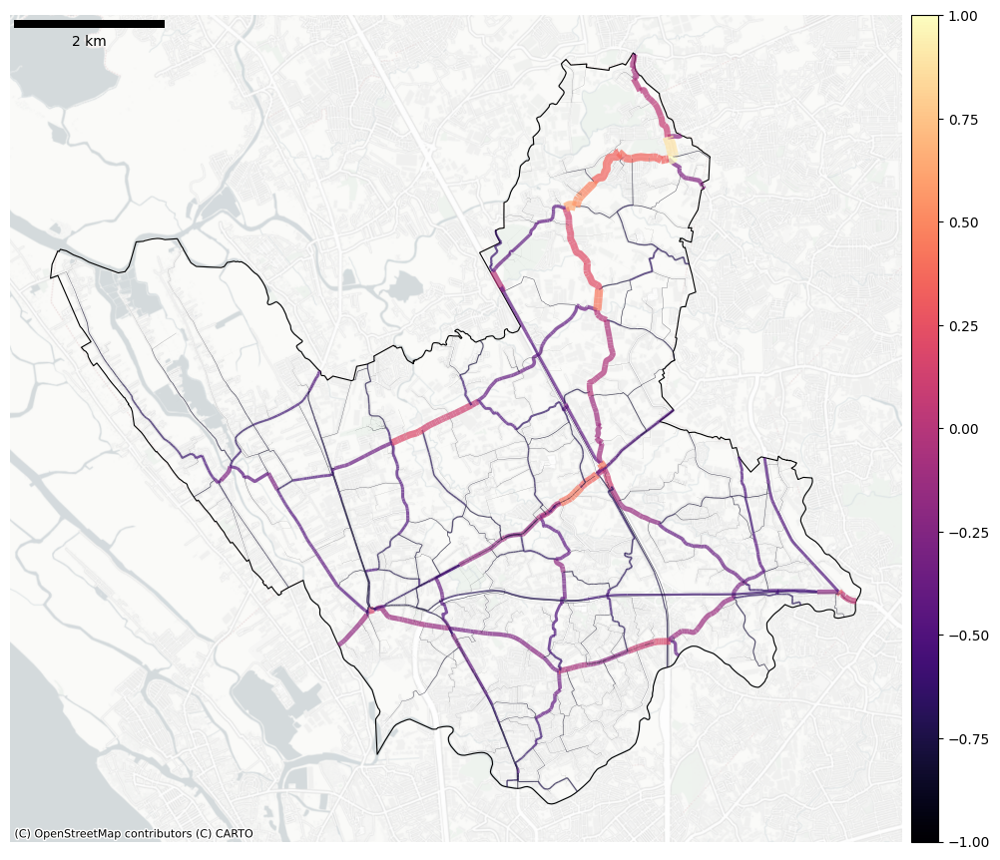

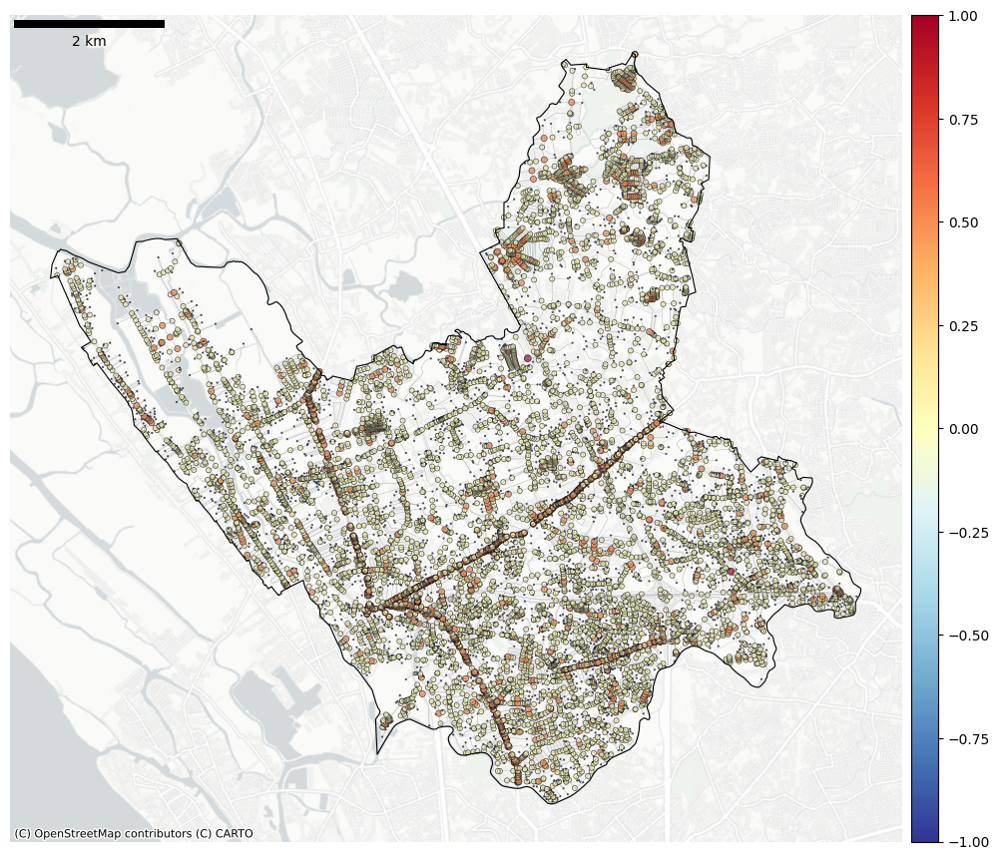

In [38]:
importlib.reload(ns)
# map closeness centrality
ax = ns.map_nodes_centrality(road_edges=edges_centrality.clip(gdf_city), road_nodes=nodes_centrality.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='RdYlGn', column='closeness_centrality')
fig=ax.figure
fig.savefig(f'{city}/png/map_closeness_centrality.png', dpi=300, bbox_inches='tight' ) # figure out ways for different weighting, i.e., decay values?
# map betweenness centrality
ax = ns.map_nodes_centrality(road_edges=edges_centrality.clip(gdf_city), road_nodes=nodes_centrality.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='magma', column='betweenness_centrality')
fig=ax.figure
fig.savefig(f'{city}/png/map_nodes_betweenness_centrality.png', dpi=300, bbox_inches='tight' )
# map edges betweenness centrality
ax = ns.map_edges_centrality(road_edges=edges_centrality.clip(gdf_city), road_nodes=nodes_centrality.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='magma')
fig=ax.figure
fig.savefig(f'{city}/png/map_edges_betweenness_centrality.png', dpi=300, bbox_inches='tight' )
# map degree centrality
ax = ns.map_nodes_centrality(road_edges=edges_centrality.clip(gdf_city), road_nodes=nodes_centrality.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='RdYlBu_r', column='degree_centrality')
fig=ax.figure
fig.savefig(f'{city}/png/map_degree_centrality.png', dpi=300, bbox_inches='tight' )

## ACCESSIBILITY
📝 I am using openrouteservice API which is limited for 500 daily query quota and 20 queries per minute. Looking for other ways to do isochrone analysis

- Access to schools
- Access to healthcare
- Access to public transportation
- Access to open spaces
- Access to fire station
- Access to jobs

### Access to Education Facilities

In [39]:
# get school POIs
tags = {'amenity': ['school', 'kindergarten', 'college', 'university', 'library']}
edu_gdf = ox.geometries_from_polygon(polygon=gdf_city_buffer.geometry.values[0], tags=tags)
# Ensure only relevant columns are kept
edu_gdf = edu_gdf[['name', 'amenity', 'geometry']].copy()
# Convert all geometries to centroids
edu_gdf['geometry'] = edu_gdf.centroid
edu_gdf['center'] = edu_gdf.geometry.apply(lambda point: [point.x, point.y])
edu_gdf = edu_gdf.reset_index()
edu_gdf

/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/811745885.py:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  edu_gdf = ox.geometries_from_polygon(polygon=gdf_city_buffer.geometry.values[0], tags=tags)
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instea

,element_type,osmid,name,amenity,geometry,center
0,node,250546463,Blessed Redeemer Christian School,kindergarten,POINT (121.03189 14.69195),"[121.031892, 14.6919522]"
1,node,255058346,St. John Institute of Technology,school,POINT (121.02735 14.68966),"[121.027351, 14.689661]"
2,node,255059861,Bagong Lote Elementary School,school,POINT (120.99804 14.66955),"[120.998038, 14.6695458]"
3,node,255060177,Children of Mary Immaculate College,college,POINT (120.96752 14.69393),"[120.9675199, 14.6939259]"
4,node,255061307,International Baptist Academy,school,POINT (120.96765 14.66846),"[120.9676522, 14.6684563]"
...,...,...,...,...,...,...
250,relation,17896270,San Bartolome High School,school,POINT (121.03079 14.70005),"[121.03078883400889, 14.700054158931847]"
251,relation,17896273,Quezon City Polytechnic University Main Campus,university,POINT (121.03261 14.70036),"[121.03261021232287, 14.700361572665186]"
252,relation,19045926,Lingunan Elementary School,school,POINT (120.97564 14.72026),"[120.97563807084246, 14.720262752235106]"
253,relation,19045936,Lingunan Senior High School,school,POINT (120.97907 14.71884),"[120.97906868350898, 14.718837020709817]"


In [40]:
importlib.reload(ns)

# call function
distances = [400, 800, 1600, 2400, 3200]
nodes_edu, edges_edu, isochrones_edu = ns.make_isochrone(road_graph, edu_gdf, distances)


/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffe

In [73]:
nodes_edu[['distance_to_nearest_origin']].describe()

/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


,distance_to_nearest_origin
count,19526.000000
mean,551.584427
std,381.016727
min,0.000000
25%,260.887500
50%,487.361500
75%,771.938500
max,3474.262000


In [41]:
# examine distribution of nearest distance to facility
display(nodes_edu['distance_to_nearest_origin'].describe());
# examine percent area coverage of facilities
isochrones_3121 = isochrones_edu.to_crs(3121).clip(gdf_city.to_crs(3121));
isochrones_3121['area_sqkm'] = isochrones_3121.area/10**6;
total_area = gdf_city.to_crs(3121).area.values[0]/10**6;
isochrones_3121['percent_covered'] = isochrones_3121['area_sqkm']/total_area;
isochrones_3121 = isochrones_3121.sort_values(by='distance', ascending=True);
display(isochrones_3121);

count    19526.000000
mean       551.584427
std        381.016727
min          0.000000
25%        260.887500
50%        487.361500
75%        771.938500
max       3474.262000
Name: distance_to_nearest_origin, dtype: float64

/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


,geometry,distance,area_sqkm,percent_covered
0,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",400,21.341553,0.456399
1,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",800,35.213750,0.753063
2,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",1600,41.587358,0.889365
3,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",2400,42.036642,0.898974
4,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",3200,42.036642,0.898974


/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


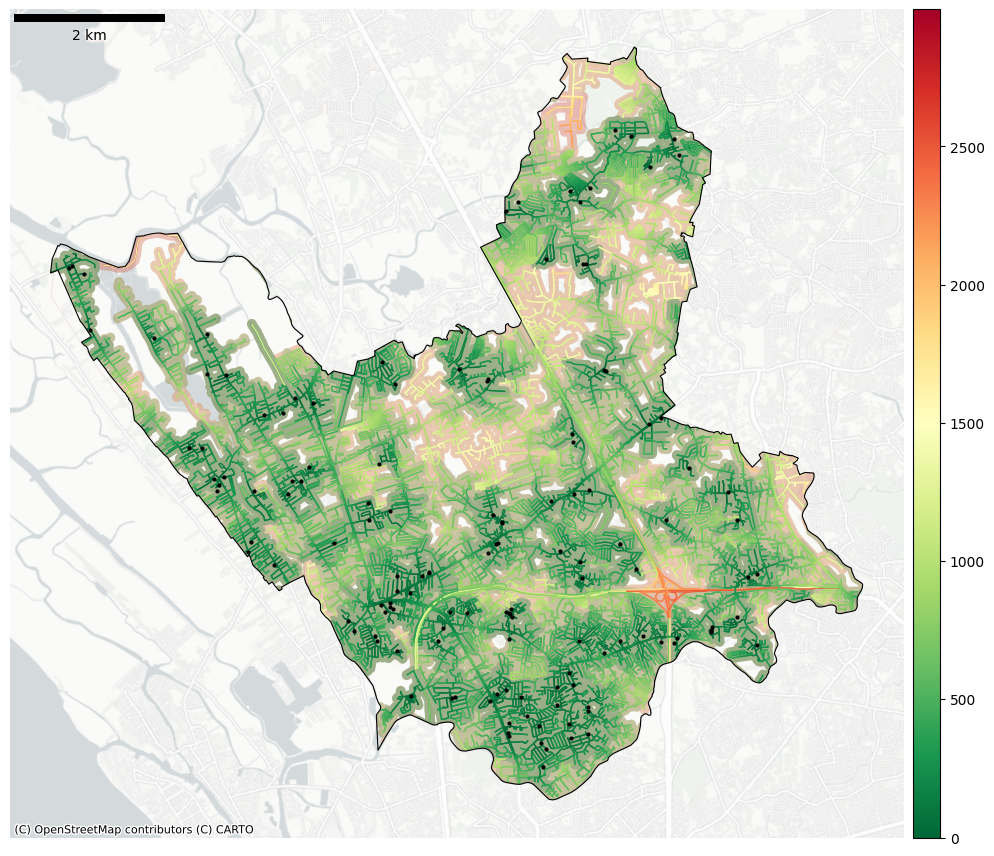

In [43]:
importlib.reload(ns)
ax = ns.map_accessibility(road_edges=edges_edu.clip(gdf_city), destination=edu_gdf.clip(gdf_city), isochrone=isochrones_edu.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='RdYlGn_r')
fig = ax.figure
fig.savefig(f'{city}/png/map_accessibility_education.png', dpi=300, bbox_inches='tight')

## Access to Healthcare

In [44]:
# get healthcare POIs
tags = {'amenity': ['clinic', 'hospital']}
health_gdf = ox.geometries_from_polygon(polygon=gdf_city_buffer.geometry.values[0], tags=tags)

# Ensure all expected columns are included, even if missing ---
desired_cols = ['name', 'amenity', 'geometry']
health_gdf = health_gdf.reindex(columns=desired_cols)
# Convert all geometries to centroids
health_gdf['geometry'] = health_gdf.centroid
health_gdf['center'] = health_gdf.geometry.apply(lambda point: [point.x, point.y])
health_gdf = health_gdf.reset_index()
health_gdf

/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/2130436194.py:3: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  health_gdf = ox.geometries_from_polygon(polygon=gdf_city_buffer.geometry.values[0], tags=tags)
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs in

,element_type,osmid,name,amenity,geometry,center
0,node,255058913,Lady Of Lourdes Hospital Of Kaybiga,hospital,POINT (121.00716 14.71953),"[121.007156, 14.719531]"
1,node,255060785,St. John Hospital,hospital,POINT (120.96562 14.69316),"[120.9656248, 14.6931601]"
2,node,255070486,Bagbaguin Family Hospital,hospital,POINT (121.00517 14.71878),"[121.005167, 14.7187774]"
3,node,255072452,Sanctissimo Rosario General Hospital,hospital,POINT (120.98435 14.67511),"[120.9843523, 14.6751115]"
4,node,589717017,B A Hospital,hospital,POINT (120.95807 14.73846),"[120.9580669, 14.7384585]"
5,node,597000047,Ann Francis Mother & Child Hospital,hospital,POINT (121.03126 14.69437),"[121.0312571, 14.6943711]"
6,node,811083342,Iba-Tunas Center,clinic,POINT (120.97736 14.75318),"[120.9773609, 14.7531765]"
7,node,2565829028,Valenzuela City Medical Center,hospital,POINT (120.97775 14.68950),"[120.9777468, 14.6894963]"
8,node,3625012464,Mendoza - Salvador Maternity & Family Clinic,clinic,POINT (120.99698 14.76625),"[120.9969765, 14.7662452]"
9,node,4574882595,98 msa agri,clinic,POINT (120.99519 14.69854),"[120.9951921, 14.6985432]"


In [45]:
importlib.reload(ns)

# call function
distances = [400, 800, 1600, 2400, 3200]
nodes_healthcare, edges_healthcare, isochrones_healthcare = ns.make_isochrone(road_graph, health_gdf, distances)

# examine distribution of nearest distance to facility
display(nodes_healthcare['distance_to_nearest_origin'].describe())
# examine percent area coverage of facilities
isochrones_3121 = isochrones_healthcare.to_crs(3121).clip(gdf_city.to_crs(3121))
isochrones_3121['area_sqkm'] = isochrones_3121.area/10**6
total_area = gdf_city.to_crs(3121).area.values[0]/10**6
isochrones_3121['percent_covered'] = isochrones_3121['area_sqkm']/total_area
isochrones_3121 = isochrones_3121.sort_values(by='distance', ascending=True)
display(isochrones_3121)

/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffe

count    19526.000000
mean      1223.085221
std        843.251618
min          0.000000
25%        593.763750
50%       1061.511000
75%       1680.430500
max       6527.239000
Name: distance_to_nearest_origin, dtype: float64

/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


,geometry,distance,area_sqkm,percent_covered
0,"MULTIPOLYGON (((925926.224 1628959.282, 925910...",400,7.675674,0.164148
1,"MULTIPOLYGON (((925926.224 1628959.282, 925910...",800,17.320286,0.370403
2,"MULTIPOLYGON (((925388.654 1629430.595, 925385...",1600,32.385424,0.692578
3,"MULTIPOLYGON (((924624.947 1630376.287, 924630...",2400,40.088696,0.857316
4,"MULTIPOLYGON (((923848.094 1631492.007, 923852...",3200,40.962581,0.876004


/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


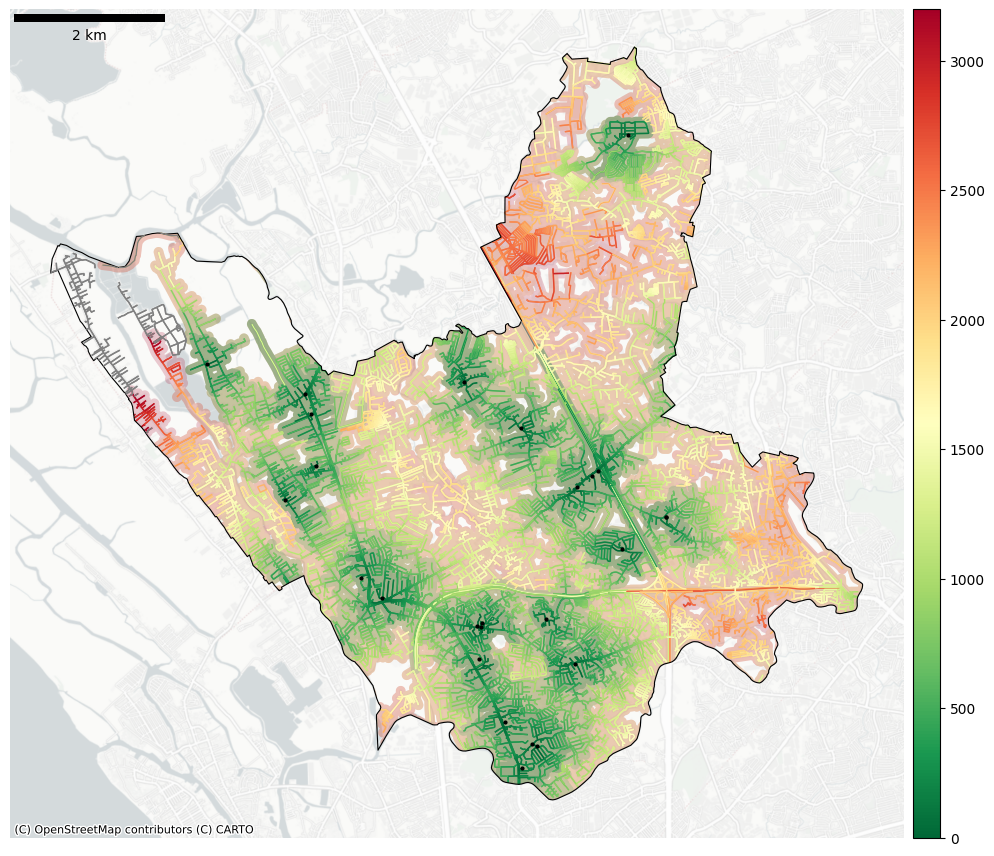

In [47]:
importlib.reload(ns)
ax = ns.map_accessibility(road_edges=edges_healthcare.clip(gdf_city), destination=health_gdf.clip(gdf_city), isochrone=isochrones_healthcare.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='RdYlGn_r')
fig = ax.figure
fig.savefig(f'{city}/png/map_accessibility_healthcare.png', dpi=300, bbox_inches='tight')

## Access to Transport

In [48]:
# get transport POIs
tags = {
    'amenity': ['bus_station'],
    'public_transport': ['station', 'platform'],
    'railway': ['station'],
    
}

transport_gdf = ox.geometries_from_polygon(polygon=gdf_city_buffer.geometry.values[0], tags=tags)
# Ensure all expected columns are included, even if missing ---
desired_cols = ['name', 'amenity', 'public_transport', 'railway', 'geometry']
transport_gdf = transport_gdf.reindex(columns=desired_cols)
# Convert all geometries to centroids
transport_gdf['geometry'] = transport_gdf.centroid
transport_gdf['center'] = transport_gdf.geometry.apply(lambda point: [point.x, point.y])
transport_gdf = transport_gdf.reset_index()
transport_gdf

/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/933759983.py:9: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  transport_gdf = ox.geometries_from_polygon(polygon=gdf_city_buffer.geometry.values[0], tags=tags)
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs 

,element_type,osmid,name,amenity,public_transport,railway,geometry,center
0,node,597749811,Malinta,NaN,platform,NaN,POINT (120.96704 14.69292),"[120.9670351, 14.6929154]"
1,node,2959979518,Tricycle Terminal,taxi,platform,NaN,POINT (120.96414 14.69262),"[120.9641357, 14.6926199]"
2,node,4217471664,Malinta(Derecho)-Novaliches Jeepney Terminal,NaN,platform,NaN,POINT (120.96714 14.69332),"[120.9671358, 14.6933174]"
3,node,4271992789,PUC-Blumentritt Jeepney Terminal,bus_station,station,NaN,POINT (121.00951 14.68047),"[121.0095137, 14.6804687]"
4,node,4271992889,PUC-Balintawak Jeepney Terminal,bus_station,station,NaN,POINT (121.00958 14.68039),"[121.0095799, 14.6803865]"
...,...,...,...,...,...,...,...,...
66,way,1016735725,NaN,NaN,platform,NaN,POINT (120.99387 14.71197),"[120.99386705, 14.711974600000001]"
67,way,1097910934,Talipapa,NaN,station,NaN,POINT (121.02177 14.68375),"[121.02177310535843, 14.683745922897293]"
68,way,1097910939,Mindanao Avenue,NaN,station,NaN,POINT (121.02842 14.69122),"[121.0284160932117, 14.691218291839263]"
69,way,1125756263,Valenzuela Modernized Jeepney Terminal,bus_station,station,NaN,POINT (120.96942 14.69472),"[120.9694153783461, 14.694717902230147]"


/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffe

count    19526.000000
mean      1170.681005
std        754.303820
min          0.000000
25%        558.898250
50%       1081.297000
75%       1655.650000
max       5026.639000
Name: distance_to_nearest_origin, dtype: float64

/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


,geometry,distance,area_sqkm,percent_covered
0,"MULTIPOLYGON (((925160.056 1629856.946, 925155...",400,8.354399,0.178663
1,"MULTIPOLYGON (((925116.968 1629770.259, 925121...",800,17.774614,0.380119
2,"MULTIPOLYGON (((924230.546 1630816.639, 924233...",1600,31.756066,0.679119
3,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",2400,39.415669,0.842923
4,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",3200,41.830168,0.894558


/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


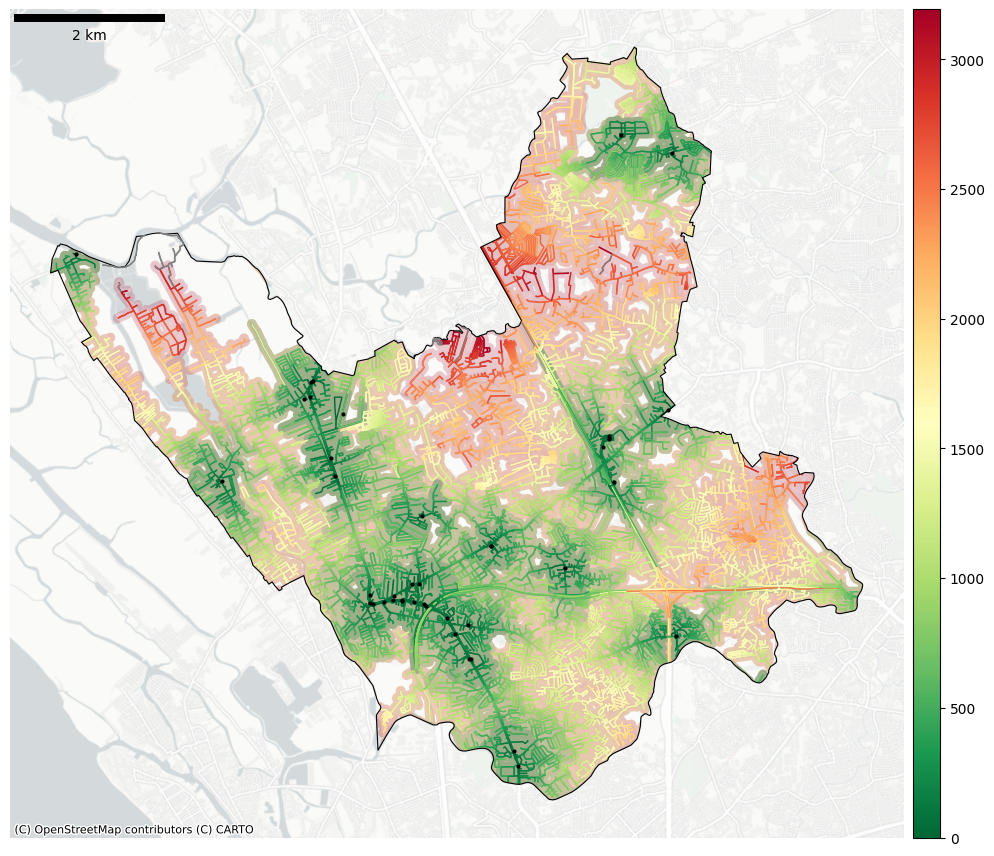

In [50]:
importlib.reload(ns)

# call function
distances = [400, 800, 1600, 2400, 3200]
nodes_transport, edges_transport, isochrones_transport = ns.make_isochrone(road_graph, transport_gdf, distances)

# examine distribution of nearest distance to facility
display(nodes_transport['distance_to_nearest_origin'].describe())
# examine percent area coverage of facilities
isochrones_3121 = isochrones_transport.to_crs(3121).clip(gdf_city.to_crs(3121))
isochrones_3121['area_sqkm'] = isochrones_3121.area/10**6
total_area = gdf_city.to_crs(3121).area.values[0]/10**6
isochrones_3121['percent_covered'] = isochrones_3121['area_sqkm']/total_area
isochrones_3121 = isochrones_3121.sort_values(by='distance', ascending=True)
display(isochrones_3121)

# map
importlib.reload(ns)
ax = ns.map_accessibility(road_edges=edges_transport.clip(gdf_city), destination=transport_gdf.clip(gdf_city), isochrone=isochrones_transport.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='RdYlGn_r')
fig = ax.figure
fig.savefig(f'{city}/png/map_accessibility_transport.png', dpi=300, bbox_inches='tight')

## Access to Open Spaces

In [51]:
import geopandas as gpd
from shapely.geometry import Polygon, MultiPolygon, Point

def interpolate_polygon_edges(gdf, spacing_meters=25):
    # Reproject to a CRS in meters for accurate distance measurements
    gdf = gdf.to_crs(epsg=3121)

    points = []

    for _, row in gdf.iterrows():
        geom = row.geometry

        if geom is None or isinstance(geom, Point):
            continue  # skip points

        # Get all exterior boundaries for Polygon or MultiPolygon
        if isinstance(geom, Polygon):
            polygons = [geom]
        elif isinstance(geom, MultiPolygon):
            polygons = list(geom.geoms)
        else:
            continue  # skip unknown geometry types

        for poly in polygons:
            boundary = poly.exterior
            length = boundary.length
            num_points = int(length // spacing_meters)

            for i in range(num_points + 1):
                point = boundary.interpolate(i * spacing_meters)
                points.append({
                    'geometry': point,
                    'source_name': row.get('name', None),
                    'source_index': row.name
                })

    # Return as GeoDataFrame (reprojected back to WGS84)
    points_gdf = gpd.GeoDataFrame(points, geometry='geometry', crs=gdf.crs)
    return points_gdf.to_crs(epsg=4326)


In [52]:
# get transport POIs
tags = {
    'leisure': ['park', 'garden', 'playground', 'pitch'],
    'landuse': ['recreation_ground', 'grass'],
    'natural': ['wood', 'scrub'],
    'place': ['square']
}
green_gdf = ox.geometries_from_polygon(polygon=gdf_city.geometry.values[0], tags=tags)
# Ensure all expected columns are included, even if missing ---
desired_cols = ['name', 'leisure', 'landuse','natural', 'place', 'geometry']
green_gdf = green_gdf.reindex(columns=desired_cols).drop_duplicates()
# Convert all geometries to centroids
green_interpolation = interpolate_polygon_edges(green_gdf, spacing_meters=200)
green_interpolation = green_interpolation.reset_index()
green_interpolation

/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/128593158.py:8: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  green_gdf = ox.geometries_from_polygon(polygon=gdf_city.geometry.values[0], tags=tags)
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  

,index,geometry,source_name,source_index
0,0,POINT (120.99238 14.70961),NaN,"(way, 41441275)"
1,1,POINT (120.99271 14.70903),NaN,"(way, 41441275)"
2,2,POINT (120.99316 14.70815),NaN,"(way, 41441276)"
3,3,POINT (120.99319 14.70808),NaN,"(way, 41441276)"
4,4,POINT (120.99216 14.70930),NaN,"(way, 41441277)"
...,...,...,...,...
259,259,POINT (120.99642 14.75209),NaN,"(relation, 16305867)"
260,260,POINT (120.99512 14.75183),NaN,"(relation, 16305867)"
261,261,POINT (120.99440 14.75218),NaN,"(relation, 16305867)"
262,262,POINT (120.99417 14.75138),NaN,"(relation, 16305867)"


/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffe

count    19526.000000
mean      1024.017459
std        798.157654
min          0.000000
25%        373.397000
50%        839.387000
75%       1508.254500
max       4102.298000
Name: distance_to_nearest_origin, dtype: float64

/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


,geometry,distance,area_sqkm,percent_covered
0,"MULTIPOLYGON (((925174.712 1629872.419, 925168...",400,18.289671,0.391133
1,"MULTIPOLYGON (((924701.025 1630401.547, 924700...",800,29.844768,0.638245
2,"MULTIPOLYGON (((923614.921 1631780.603, 923618...",1600,39.300531,0.840461
3,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",2400,41.620361,0.890071
4,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",3200,41.970869,0.897567


/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


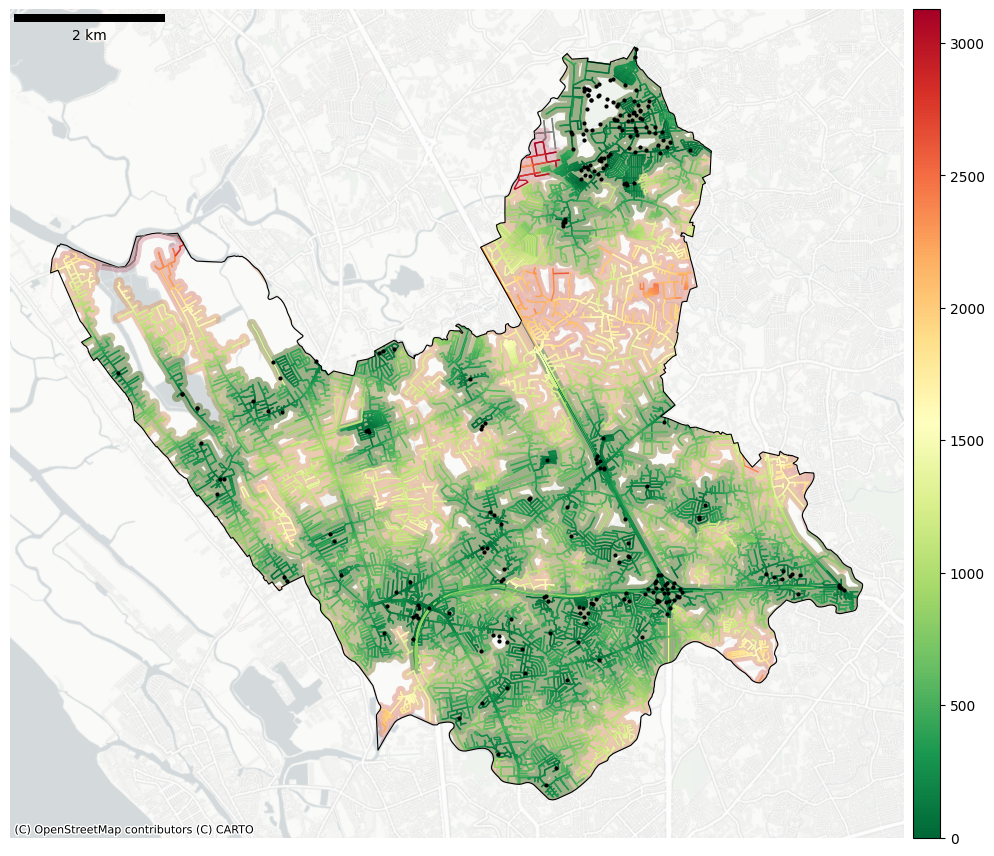

In [53]:
importlib.reload(ns)

# call function
distances = [400, 800, 1600, 2400, 3200]
nodes_green, edges_green, isochrones_green = ns.make_isochrone(road_graph, green_interpolation, distances)

# examine distribution of nearest distance to facility
display(nodes_green['distance_to_nearest_origin'].describe())
# examine percent area coverage of facilities
isochrones_3121 = isochrones_green.to_crs(3121).clip(gdf_city.to_crs(3121))
isochrones_3121['area_sqkm'] = isochrones_3121.area/10**6
total_area = gdf_city.to_crs(3121).area.values[0]/10**6
isochrones_3121['percent_covered'] = isochrones_3121['area_sqkm']/total_area
isochrones_3121 = isochrones_3121.sort_values(by='distance', ascending=True)
display(isochrones_3121)

# map
importlib.reload(ns)
ax = ns.map_accessibility(road_edges=edges_green.clip(gdf_city), destination=green_interpolation.clip(gdf_city), isochrone=isochrones_green.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='RdYlGn_r')
fig = ax.figure
fig.savefig(f'{city}/png/map_accessibility_green.png', dpi=300, bbox_inches='tight')

## Accessibility of Fire Stations

In [55]:
# get fire station POIs
tags = {
    'amenity': ['fire_station'],
}
fire_gdf = ox.geometries_from_polygon(polygon=gdf_city_buffer.geometry.values[0], tags=tags)
# Ensure all expected columns are included, even if missing ---
desired_cols = ['name', 'amenity', 'geometry']
fire_gdf = fire_gdf.reindex(columns=desired_cols).drop_duplicates()
# Convert all geometries to centroids
fire_gdf['geometry'] = fire_gdf.centroid
fire_gdf['center'] = fire_gdf.geometry.apply(lambda point: [point.x, point.y])
fire_gdf = fire_gdf.reset_index()
fire_gdf

/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/2716821930.py:5: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  fire_gdf = ox.geometries_from_polygon(polygon=gdf_city_buffer.geometry.values[0], tags=tags)
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs inst

,element_type,osmid,name,amenity,geometry,center
0,node,582962677,Obando Fire Station,fire_station,POINT (120.93533 14.71153),"[120.9353309, 14.7115331]"
1,node,582975922,Polo Fire Station,fire_station,POINT (120.94632 14.70803),"[120.9463152, 14.7080322]"
2,node,1341215525,Panghulo Barangay Fire Station,fire_station,POINT (120.95633 14.68605),"[120.9563269, 14.6860464]"
3,node,4930412321,Valenzuela Primo,fire_station,POINT (120.97878 14.68237),"[120.9787829, 14.6823729]"
4,node,7231922072,Doña Ata Fire Sub-station,fire_station,POINT (120.98454 14.67744),"[120.9845386, 14.6774363]"
5,node,8737300203,Lawang Bato Fire Station,fire_station,POINT (120.99404 14.73035),"[120.9940356, 14.7303498]"
6,node,8737449358,Caybiga Fire Sub-station,fire_station,POINT (121.00714 14.71905),"[121.0071355, 14.7190524]"
7,node,9733763463,Canuman Fire Station,fire_station,POINT (120.98489 14.70680),"[120.9848916, 14.7068022]"
8,node,10258383320,NaN,fire_station,POINT (120.96129 14.70419),"[120.9612949, 14.7041911]"
9,node,10717587634,Barangay Potrero Firefighters Squad,fire_station,POINT (120.98338 14.66310),"[120.9833767, 14.6630996]"


/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffe

count    19526.000000
mean      1739.648891
std       1114.037148
min          0.000000
25%        896.467500
50%       1518.014000
75%       2398.359250
max       6072.777000
Name: distance_to_nearest_origin, dtype: float64

/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


,geometry,distance,area_sqkm,percent_covered
0,"MULTIPOLYGON (((924057.454 1631124.266, 924062...",400,4.840160,0.103509
1,"MULTIPOLYGON (((923856.732 1631480.704, 923863...",800,11.929322,0.255114
2,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",1600,29.638145,0.633826
3,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",2400,38.978497,0.833574
4,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",3200,41.094565,0.878827


/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


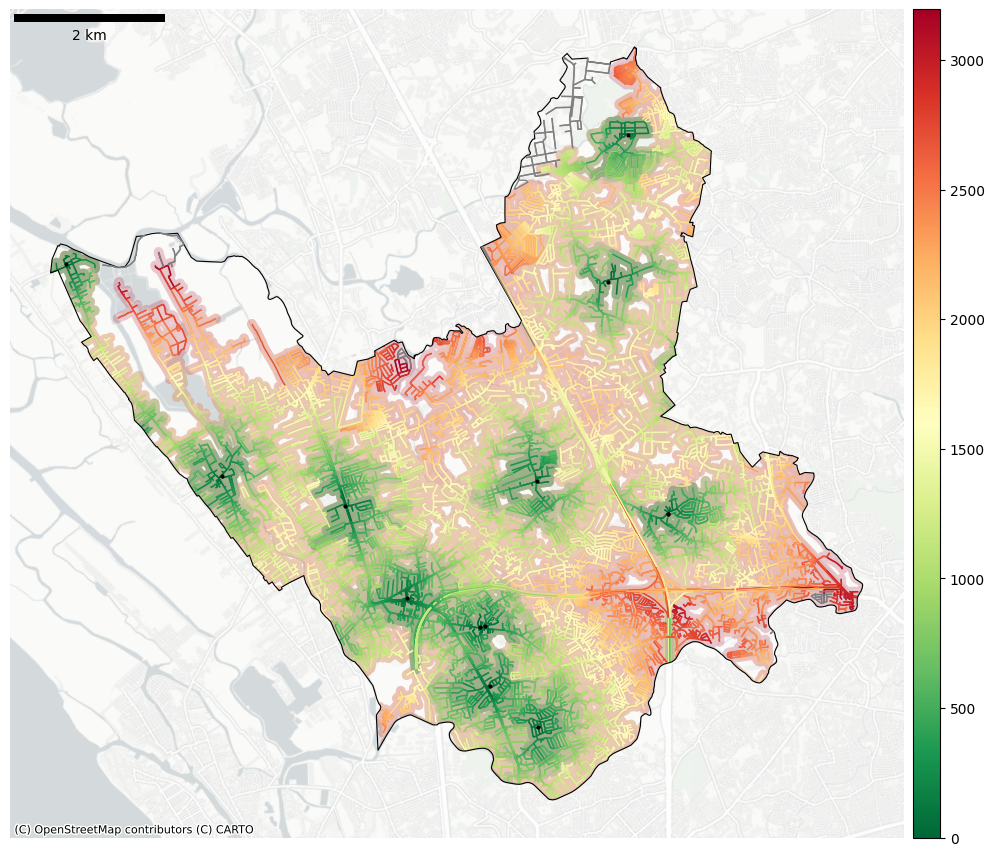

In [56]:
importlib.reload(ns)

# call function
distances = [400, 800, 1600, 2400, 3200]
nodes_fire, edges_fire, isochrones_fire = ns.make_isochrone(road_graph, fire_gdf, distances)

# examine distribution of nearest distance to facility
display(nodes_fire['distance_to_nearest_origin'].describe())
# examine percent area coverage of facilities
isochrones_3121 = isochrones_fire.to_crs(3121).clip(gdf_city.to_crs(3121))
isochrones_3121['area_sqkm'] = isochrones_3121.area/10**6
total_area = gdf_city.to_crs(3121).area.values[0]/10**6
isochrones_3121['percent_covered'] = isochrones_3121['area_sqkm']/total_area
isochrones_3121 = isochrones_3121.sort_values(by='distance', ascending=True)
display(isochrones_3121)

# map
importlib.reload(ns)
ax = ns.map_accessibility(road_edges=edges_fire.clip(gdf_city), destination=fire_gdf.clip(gdf_city), isochrone=isochrones_fire.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='RdYlGn_r')
fig = ax.figure
fig.savefig(f'{city}/png/map_accessibility_fire.png', dpi=300, bbox_inches='tight')

## Access to Food Supply

In [57]:
# get food supply POIs
tags = {
    'shop': ['supermarket', 'convenience', 'marketplace'], 
    'amenity': 'marketplace'
}
food_gdf = ox.geometries_from_polygon(polygon=gdf_city.geometry.values[0], tags=tags)

# Ensure all expected columns are included, even if missing ---
desired_cols = ['name', 'shop','amenity', 'geometry']
food_gdf = food_gdf.reindex(columns=desired_cols).drop_duplicates()
# Convert all geometries to centroids
food_gdf['geometry'] = food_gdf.centroid
food_gdf['center'] = food_gdf.geometry.apply(lambda point: [point.x, point.y])
food_gdf = food_gdf.reset_index()
food_gdf

/var/folders/_j/40dgp1fx17bb2bwpyzg2rbc80000gn/T/ipykernel_19341/3101921889.py:6: FutureWarning: The `geometries` module and `geometries_from_X` functions have been renamed the `features` module and `features_from_X` functions. Use these instead. The `geometries` module and function names are deprecated and will be removed in the v2.0.0 release. See the OSMnx v2 migration guide: https://github.com/gboeing/osmnx/issues/1123
  food_gdf = ox.geometries_from_polygon(polygon=gdf_city.geometry.values[0], tags=tags)
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  

,element_type,osmid,name,shop,amenity,geometry,center
0,node,527759889,7-Eleven,convenience,NaN,POINT (120.96419 14.69256),"[120.9641935, 14.6925589]"
1,node,577023111,7-Eleven,convenience,NaN,POINT (120.95991 14.70861),"[120.9599094, 14.7086077]"
2,node,583449931,Pufu Store,convenience,NaN,POINT (120.94840 14.70376),"[120.9483952, 14.7037591]"
3,node,593994042,7-Eleven,convenience,NaN,POINT (120.97411 14.69003),"[120.9741103, 14.6900304]"
4,node,593995122,Uncle John's,convenience,NaN,POINT (120.98045 14.67757),"[120.9804512, 14.6775668]"
...,...,...,...,...,...,...,...
186,way,1326147191,7-Eleven,convenience,NaN,POINT (120.95820 14.69880),"[120.95820065022386, 14.69880382412703]"
187,way,1348969040,Dali,convenience,NaN,POINT (120.98238 14.67896),"[120.98238458252689, 14.678962501407375]"
188,way,1348969043,Dali,convenience,NaN,POINT (120.98796 14.68864),"[120.9879617197672, 14.688640244408937]"
189,way,1350695723,Budget King Supermarket,supermarket,NaN,POINT (120.99581 14.74915),"[120.99581488444747, 14.749154157860687]"


/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffer_geom = filtered.buffer(buffer_size).unary_union
/Users/danielcp/Documents/[2023] WORLD_BANK/21_CRP/07_Network Scan/01_Philippines/network_scan_helper.py:614: UserWarning: Geometry is in a geographic CRS. Results from 'buffer' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  buffe

count    19526.000000
mean      1122.961551
std       1014.937737
min          0.000000
25%        331.611000
50%        761.560000
75%       1775.377750
max       5500.947000
Name: distance_to_nearest_origin, dtype: float64

/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


,geometry,distance,area_sqkm,percent_covered
0,"MULTIPOLYGON (((925116.968 1629770.259, 925121...",400,23.855463,0.510160
1,"MULTIPOLYGON (((924624.947 1630376.287, 924630...",800,34.555088,0.738977
2,"MULTIPOLYGON (((923614.921 1631780.603, 923618...",1600,40.009092,0.855613
3,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",2400,41.035902,0.877572
4,"MULTIPOLYGON (((922879.863 1633247.956, 922883...",3200,41.957059,0.897272


/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(
/Users/danielcp/opt/anaconda3/envs/bagidata/lib/python3.11/site-packages/pandas/core/frame.py:717: DeprecationWarning: Passing a BlockManager to GeoDataFrame is deprecated and will raise in a future version. Use public APIs instead.
  warnings.warn(


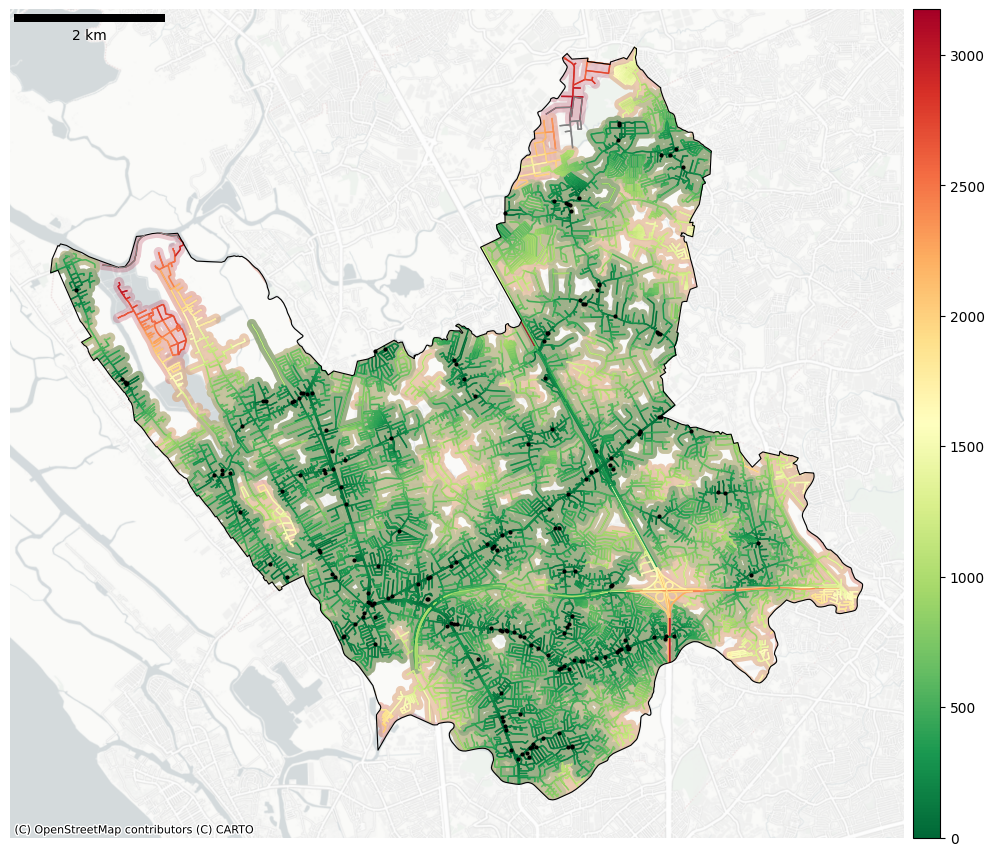

In [58]:
importlib.reload(ns)

# call function
distances = [400, 800, 1600, 2400, 3200]
nodes_food, edges_food, isochrones_food = ns.make_isochrone(road_graph, food_gdf, distances)

# examine distribution of nearest distance to facility
display(nodes_food['distance_to_nearest_origin'].describe())
# examine percent area coverage of facilities
isochrones_3121 = isochrones_food.to_crs(3121).clip(gdf_city.to_crs(3121))
isochrones_3121['area_sqkm'] = isochrones_3121.area/10**6
total_area = gdf_city.to_crs(3121).area.values[0]/10**6
isochrones_3121['percent_covered'] = isochrones_3121['area_sqkm']/total_area
isochrones_3121 = isochrones_3121.sort_values(by='distance', ascending=True)
display(isochrones_3121)

# map
importlib.reload(ns)
ax = ns.map_accessibility(road_edges=edges_food.clip(gdf_city), destination=food_gdf.clip(gdf_city), isochrone=isochrones_food.clip(gdf_city), gdf_border=gdf_city, crs=3121, colormap='RdYlGn_r')
fig = ax.figure
fig.savefig(f'{city}/png/map_accessibility_food.png', dpi=300, bbox_inches='tight')

to do: 
* export to geojson
* generate summary statistic table
* loop for multiple cities
* logging system
* isochrone buffer clipped 
